<a href="https://colab.research.google.com/github/JoelmirDias/Trabalho/blob/main/Dessalgadora_Final_Binario_200_ipyn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Modelo de arraste da dessalgadora da U200

In [1]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 22.0 MB 1.4 MB/s 
     |████████████████████████████████| 102 kB 6.5 MB/s 
     |████████████████████████████████| 690 kB 33.1 MB/s 
     |████████████████████████████████| 4.7 MB 48.7 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
     |████████████████████████████████| 9.8 MB 26.4 MB/s 
     |████████████████████████████████| 296 kB 70.5 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.3.1-py2.py3-none-any.whl size=310100 sha256=3021bb8bb39f78b4f341fdd29956c90d1f0af4feb081154ac0347c7e9c4af9a2
  Stored in directory: /tmp/pip-ephem-wheel-cache-9lzzu27h/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=853d3456bad570595cb4a623227078eebfebcf99bb1aabe2ffab562650c64b51
  Stored in directory: /root/.cache/pip/whee

In [2]:
from __future__ import print_function
%matplotlib inline
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as image
import pandas as pd
from pandas_profiling import ProfileReport
plt.style.use("ggplot")
warnings.simplefilter("ignore")
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
import seaborn as sns

In [3]:
plt.rcParams['figure.figsize'] = (12,8)


### Importação dos dados

In [4]:
url='https://github.com/JoelmirDias/Trabalho/blob/main/Dados_Dessalg_200.xlsx?raw=true'

In [5]:
dados=pd.read_excel(url, sheet_name='Dados_Exporta')

In [6]:
dados.tail()

,SALMOURA,TI20104,TI20105,TI20159,TI20160,Carga,Densidade,POLI,DESEM,pH,LIC20006,LIC20007,LIC20041,LIC20042,PDI20002,PDI20004,PDI20105,PDI20106
8669,CLARA,140.369629,145.977402,150.650299,146.631989,36160.781250,0.875926,NÃO INJETA,NÃO INJETA,8.6,57.997265,60.054665,60.768444,63.660042,1.216864,1.201391,0.565016,0.620297
8670,CLARA,139.483337,146.289230,151.337753,145.765305,36189.132812,0.875926,NÃO INJETA,NÃO INJETA,8.6,57.829548,60.412449,61.992104,63.548759,1.219020,1.181458,0.582732,0.634662
8671,CLARA,139.750015,146.487885,151.371628,145.963593,36189.445312,0.877789,INJETA,NÃO INJETA,8.6,57.940624,59.976795,62.156967,64.395615,1.248344,1.199435,0.573938,0.625889
8672,CLARA,142.407349,147.726700,151.613007,148.435486,36163.687500,0.877789,INJETA,NÃO INJETA,8.6,58.126801,60.536724,59.757896,56.683945,1.176833,1.169220,0.499617,0.603526
8673,CLARA,143.328003,148.613419,152.170303,147.464447,36184.152344,0.877789,NÃO INJETA,NÃO INJETA,8.6,57.939140,59.604969,62.903980,62.103767,1.175655,1.174373,0.539179,0.615754


### Relatório dos dados

In [7]:
profile=dados.profile_report()
profile.to_file(output_file="dessalgadora.html")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Hot-Encoding: Criação de variáveis dummies

In [8]:
cat_vars=['POLI','DESEM']
for var in cat_vars:
  cat_list = pd.get_dummies(dados[var], prefix=var)
  dados = dados.join(cat_list)

In [9]:
dados['SALMOURA'].value_counts()

CLARA     7528
ESCURA     589
TURVA      557
Name: SALMOURA, dtype: int64

In [10]:
Arraste=[]
for i in range(len(dados['SALMOURA'])):
  if dados['SALMOURA'][i]=='CLARA':
    Arraste.append(0)
  else:
    Arraste.append(2)
dados['Arraste']=Arraste

In [11]:
dados.drop(columns=['SALMOURA','POLI','DESEM','DESEM_NÃO INJETA','POLI_NÃO INJETA' ], inplace=True)

### Visualização do Desbalanceamento

In [12]:
from yellowbrick.target import ClassBalance
plt.style.use("ggplot")
plt.rcParams['figure.figsize'] = (12,8)

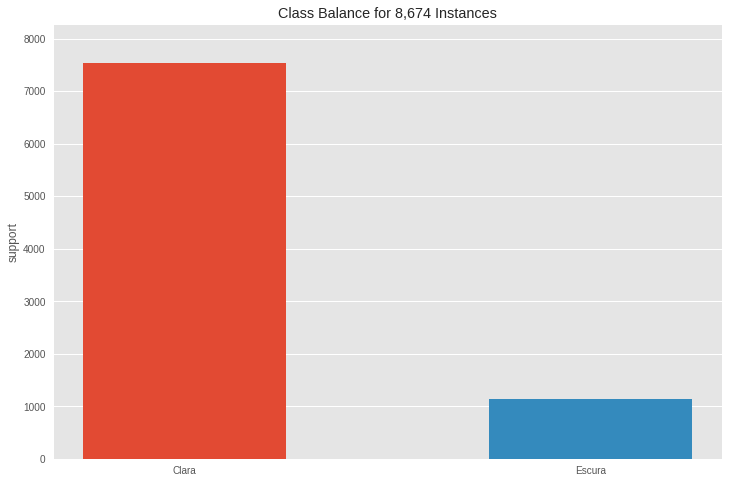

In [13]:
visualizer=ClassBalance(labels=['Clara','Escura']).fit(dados.Arraste)
visualizer.show()

Conclusão: Modelo bastante desbalanceado. Utilizaremos técnica de sobre/sub-amostragem

In [14]:
dados.Arraste.value_counts()

0    7528
2    1146
Name: Arraste, dtype: int64

Considera-se que há dados suficiente da categoria 1 e 2 para fazer subamostragem.

### Técnica de Subamostragem

In [15]:
from imblearn.under_sampling import RandomUnderSampler

In [16]:
X = dados.loc[:, dados.columns != 'Arraste']
y = dados.Arraste

In [17]:
sub=RandomUnderSampler()
x_sub,y_sub=sub.fit_resample(X, y)
y_sub.value_counts()

0    1146
2    1146
Name: Arraste, dtype: int64

In [35]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x_sub, y_sub, test_size=0.2, stratify=y_sub)

### Criação dos Modelos

In [19]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz # display the tree within a Jupyter notebook
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
from ipywidgets import interactive, IntSlider, FloatSlider, interact
import ipywidgets
from IPython.display import Image
from subprocess import call
import matplotlib.image as mpimg
from yellowbrick.model_selection import FeatureImportances
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import ClassificationReport

In [20]:
from sklearn.metrics import confusion_matrix as cm
from sklearn.metrics import ConfusionMatrixDisplay
plt.rcParams['figure.figsize']=[16,9]

### Ajuste RandomForest

In [21]:
from sklearn.model_selection import KFold
crossvalidation=KFold(n_splits=5, shuffle=True, random_state=1)
scorer='accuracy'
max_features=[x_sub.shape[1]/3, 'sqrt','log2','auto']
min_samples_leaf=[1,10,30]
n_estimators=[50,100,300]
RF=RandomForestClassifier()

In [36]:
search_grid= {'n_estimators':n_estimators,'max_features': max_features,'min_samples_leaf':min_samples_leaf}
rf_cv=GridSearchCV(estimator=RF,
                         param_grid=search_grid,
                         scoring=scorer,
                         cv=crossvalidation)
rf_cv.fit(X_train,y_train)
best_params=rf_cv.best_params_
best_score=rf_cv.best_score_
print('Melhores parâmetros: %s'% best_params)
print('Melhor acurácia: %s'% best_score)

Melhores parâmetros: {'max_features': 'auto', 'min_samples_leaf': 1, 'n_estimators': 300}
Melhor acurácia: 0.7283140513095397


In [43]:
y_rf_cv=rf_cv.predict(X_test)

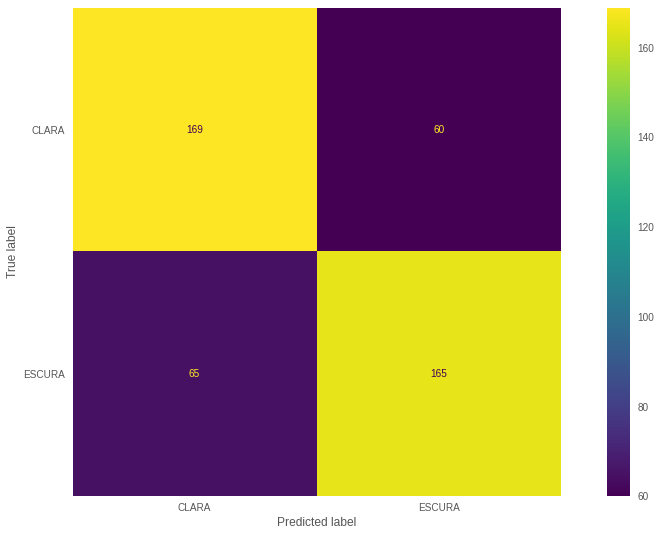

In [44]:
from sklearn.metrics import plot_confusion_matrix
mc_rf_cv=cm(y_test, y_rf_cv)
#mcd_Melhor=ConfusionMatrixDisplay(mc_rf_cv, display_labels=['CLARA','ESCURA'],)
#mcd_Melhor.plot()
plot_confusion_matrix(rf_cv, X_test, y_test, display_labels=['CLARA','ESCURA'])
plt.tick_params(axis=u'both', which=u'both',length=0)
plt.grid(b=None)
plt.show()


### Árvore de Decisão

In [45]:
parameters = {'criterion': ['gini', 'entropy'],
     'splitter': ['best', 'random'],
     'max_depth': [2*n for n in range(1,10)],
     'max_features': ['auto', 'sqrt'],
     'min_samples_leaf': [1, 2, 4],
     'min_samples_split': [2, 5, 10]}

tree = DecisionTreeClassifier()

In [46]:
tree_cv=GridSearchCV(estimator=DecisionTreeClassifier(),param_grid=parameters,cv=10)
tree_cv.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'splitter': ['best', 'random']})

In [47]:
y_tree_cv=tree_cv.predict(X_test)

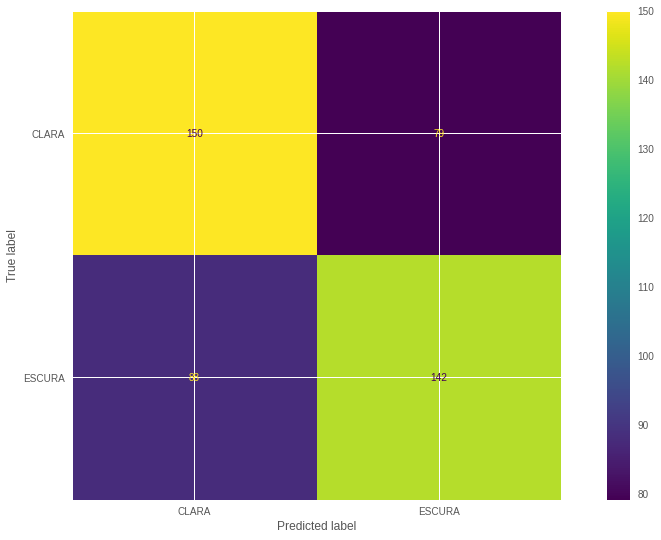

In [48]:
mc_Tree=cm(y_test, y_tree_cv)
mcd_Tree=ConfusionMatrixDisplay(mc_Tree, display_labels=['CLARA','ESCURA'])
mcd_Tree.plot()

In [49]:
print("Hiperparâmetros: ",tree_cv.best_params_)
print("Acurácia :",tree_cv.best_score_)

Hiperparâmetros:  {'criterion': 'entropy', 'max_depth': 18, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'splitter': 'best'}
Acurácia : 0.6743347588500831


### Logística

In [50]:
parameters ={'C':[0.01,0.1,1],
             'penalty':['l2'],
             'solver':['lbfgs']}

In [51]:
parameters ={"C":[0.01,0.1,1],'penalty':['l2'], 'solver':['lbfgs']}# l1 lasso l2 ridge
lr=LogisticRegression()
logreg_cv=GridSearchCV(estimator=LogisticRegression(),param_grid=parameters,cv=10)
logreg_cv.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1], 'penalty': ['l2'],
                         'solver': ['lbfgs']})

In [32]:
print("Hiperparâmetros: ",logreg_cv.best_params_)
print("Acurácia :",logreg_cv.best_score_)

Hiperparâmetros:  {'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}
Acurácia : 0.5748718944099378


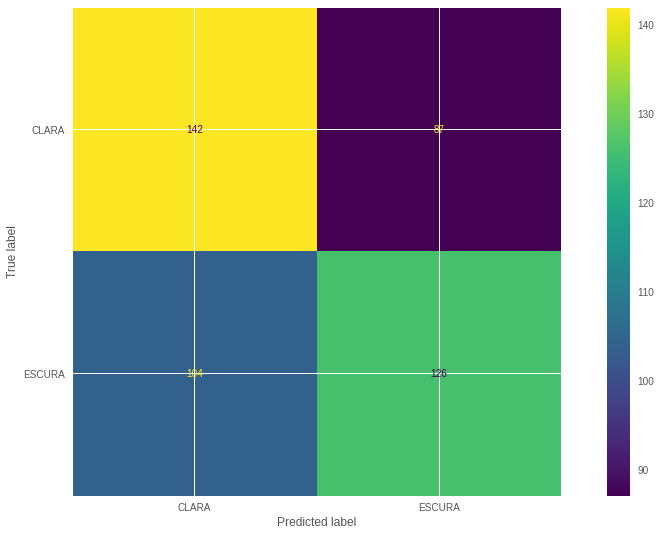

In [52]:
y_predlog=logreg_cv.predict(X_test)
mc_log=cm(y_test, y_predlog)
mcdlog=ConfusionMatrixDisplay(mc_log, display_labels=['CLARA','ESCURA'])
mcdlog.plot()

## O melhor ajuste foi o Random Forest

### Preparando exportação do modelo

### Ajuste com todos os dados

In [34]:
rf_final=GridSearchCV(estimator=RF,
                         param_grid=search_grid,
                         scoring=scorer,
                         cv=crossvalidation)
rf_final.fit(x_sub,y_sub)
best_params=rf_final.best_params_
best_score=rf_final.best_score_
print('Melhores parâmetros: %s'% best_params)
print('Melhor acurácia: %s'% best_score)

Melhores parâmetros: {'max_features': 'sqrt', 'min_samples_leaf': 1, 'n_estimators': 300}
Melhor acurácia: 0.7273168364871422


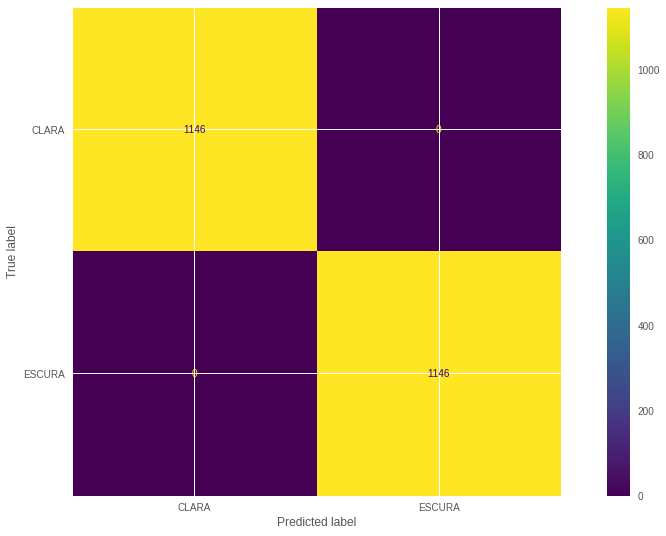

In [37]:
y_rf_final=rf_final.predict(x_sub)
mc_final=cm(y_sub, y_rf_final)
mcd_final=ConfusionMatrixDisplay(mc_final, display_labels=['CLARA','ESCURA'])
mcd_final.plot()

### Exportação do Modelo

In [53]:
# salvar modelo
import pickle
# salvar o modelo RandomForest (RF) no arquivo dessalgadora.pkl
with open('dessalgadora200.pkl', 'wb') as file:
    pickle.dump(rf_final, file)

### Métrica

In [38]:
from yellowbrick.classifier import ClassificationReport

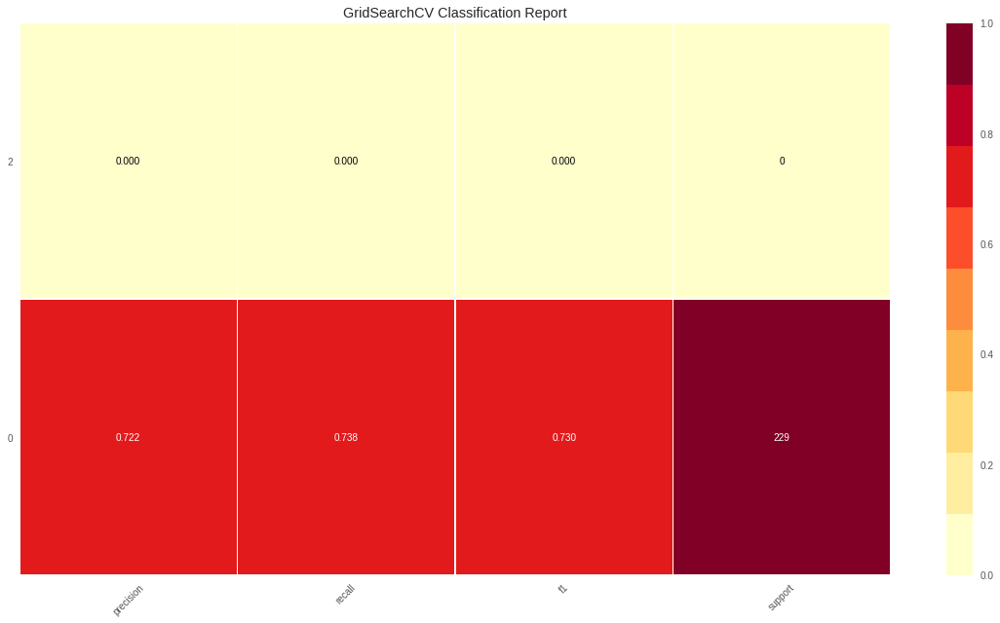

In [39]:
clr = ClassificationReport(rf_cv, support=True)
clr.fit(X_train,y_train)
clr.score(X_test,y_test)
clr.show()

## Gradient Booster

In [40]:
clf = GradientBoostingClassifier(n_estimators=100,
                                 learning_rate=1.0, 
                                 max_depth=1, random_state=0)
clf.fit(X_train, y_train) 
clf.score(X_test, y_test) 


0.673202614379085

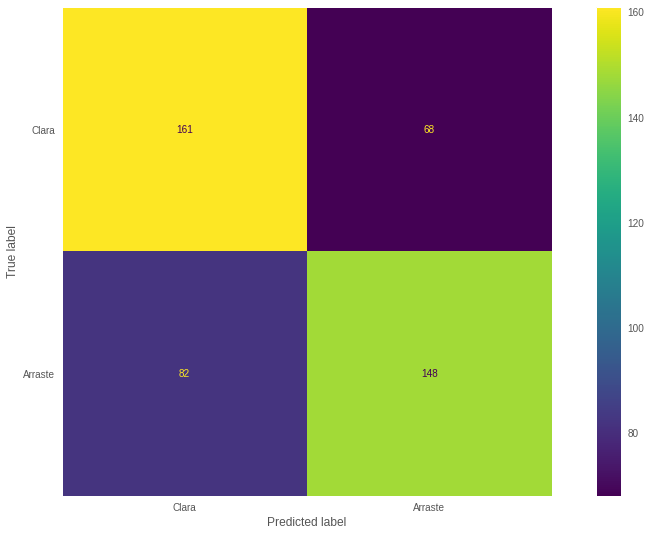

In [41]:
plot_confusion_matrix(clf,X_test,y_test,display_labels=['Clara','Arraste'])
plt.grid(b=None)


[Text(0.6209505346705633, 0.9814814814814815, 'X[10] <= 73.967\ngini = 0.5\nsamples = 1435\nvalue = [1150, 1142]'),
 Text(0.30015631038063956, 0.9444444444444444, 'X[10] <= 56.621\ngini = 0.497\nsamples = 1211\nvalue = [1045, 895]'),
 Text(0.06067046662158246, 0.9074074074074074, 'X[9] <= 53.896\ngini = 0.455\nsamples = 136\nvalue = [78, 145]'),
 Text(0.02782339870543909, 0.8703703703703703, 'X[0] <= 144.791\ngini = 0.494\nsamples = 36\nvalue = [30, 24]'),
 Text(0.015457443725243937, 0.8333333333333334, 'X[13] <= 0.986\ngini = 0.26\nsamples = 15\nvalue = [22, 4]'),
 Text(0.009274466235146363, 0.7962962962962963, 'X[11] <= 0.792\ngini = 0.159\nsamples = 13\nvalue = [21, 2]'),
 Text(0.0061829774900975755, 0.7592592592592593, 'X[3] <= 149.557\ngini = 0.408\nsamples = 6\nvalue = [5, 2]'),
 Text(0.0030914887450487877, 0.7222222222222222, 'gini = 0.0\nsamples = 4\nvalue = [5, 0]'),
 Text(0.009274466235146363, 0.7222222222222222, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]'),
 Text(0.01236595498

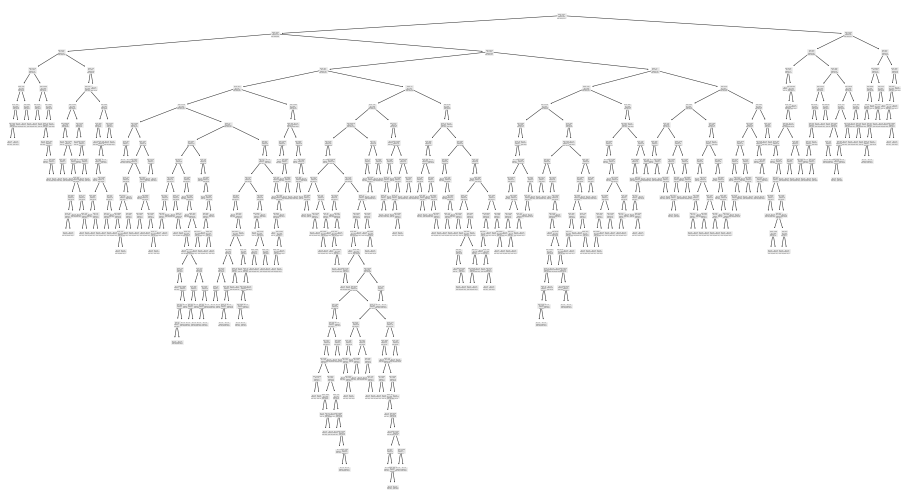

In [42]:
from sklearn import tree
tree.plot_tree(rf_final.best_estimator_.estimators_[0])